In [1]:
import os
import sys

import matplotlib.pyplot as plt
import seaborn as sns
import matplotlib as mpl
import numpy as np
import statsmodels.api as sm

# Append the scripts folder to the path
sys.path.insert(0, 'C:/Users/amanu/OneDrive/Desktop/week_0/')

In [2]:
from scripts.eda_helpers import read_csv_to_df, describe_df, summary_statistics, check_missing_values,check_outliers,check_incorrect_entries,calculate_correlation_matrix,create_correlation_heatmap,create_pair_plot,create_scatter_matrix,create_polar_plot,analyze_temperature_data,create_histograms,calculate_zscores,create_bubble_charts

In [3]:
togo_df=read_csv_to_df('../data/togo-dapaong_qc.csv')
sierraleone_df=read_csv_to_df('../data/sierraleone-bumbuna.csv')
benin_df=read_csv_to_df('../data/benin-malanville.csv')


In [4]:
togo_df

,Timestamp,GHI,DNI,DHI,ModA,ModB,Tamb,RH,WS,WSgust,WSstdev,WD,WDstdev,BP,Cleaning,Precipitation,TModA,TModB,Comments
0,2021-10-25 00:01,-1.3,0.0,0.0,0.0,0.0,24.8,94.5,0.9,1.1,0.4,227.6,1.1,977,0,0.0,24.7,24.4,NaN
1,2021-10-25 00:02,-1.3,0.0,0.0,0.0,0.0,24.8,94.4,1.1,1.6,0.4,229.3,0.7,977,0,0.0,24.7,24.4,NaN
2,2021-10-25 00:03,-1.3,0.0,0.0,0.0,0.0,24.8,94.4,1.2,1.4,0.3,228.5,2.9,977,0,0.0,24.7,24.4,NaN
3,2021-10-25 00:04,-1.2,0.0,0.0,0.0,0.0,24.8,94.3,1.2,1.6,0.3,229.1,4.6,977,0,0.0,24.7,24.4,NaN
4,2021-10-25 00:05,-1.2,0.0,0.0,0.0,0.0,24.8,94.0,1.3,1.6,0.4,227.5,1.6,977,0,0.0,24.7,24.4,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
525595,2022-10-24 23:56,-0.8,0.0,0.0,0.0,0.0,25.2,53.8,0.0,0.0,0.0,0.0,0.0,977,0,0.0,24.3,24.0,NaN
525596,2022-10-24 23:57,-0.9,0.0,0.0,0.0,0.0,25.3,53.5,0.0,0.0,0.0,0.0,0.0,977,0,0.0,24.3,24.0,NaN
525597,2022-10-24 23:58,-1.0,0.0,0.0,0.0,0.0,25.3,53.4,0.0,0.0,0.0,0.0,0.0,977,0,0.0,24.2,23.9,NaN
525598,2022-10-24 23:59,-1.1,0.0,0.0,0.0,0.0,25.4,53.5,0.0,0.0,0.0,0.0,0.0,977,0,0.0,24.1,23.8,NaN


In [5]:
sierraleone_df

,Timestamp,GHI,DNI,DHI,ModA,ModB,Tamb,RH,WS,WSgust,WSstdev,WD,WDstdev,BP,Cleaning,Precipitation,TModA,TModB,Comments
0,2021-10-30 00:01,-0.7,-0.1,-0.8,0.0,0.0,21.9,99.1,0.0,0.0,0.0,0.0,0.0,1002,0,0.0,22.3,22.6,NaN
1,2021-10-30 00:02,-0.7,-0.1,-0.8,0.0,0.0,21.9,99.2,0.0,0.0,0.0,0.0,0.0,1002,0,0.0,22.3,22.6,NaN
2,2021-10-30 00:03,-0.7,-0.1,-0.8,0.0,0.0,21.9,99.2,0.0,0.0,0.0,0.0,0.0,1002,0,0.0,22.3,22.6,NaN
3,2021-10-30 00:04,-0.7,0.0,-0.8,0.0,0.0,21.9,99.3,0.0,0.0,0.0,0.0,0.0,1002,0,0.1,22.3,22.6,NaN
4,2021-10-30 00:05,-0.7,-0.1,-0.8,0.0,0.0,21.9,99.3,0.0,0.0,0.0,0.0,0.0,1002,0,0.0,22.3,22.6,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
525595,2022-10-29 23:56,-1.6,-0.1,-2.9,0.0,0.0,24.0,100.0,0.0,0.0,0.0,0.0,0.0,999,0,0.0,24.2,24.5,NaN
525596,2022-10-29 23:57,-1.7,-0.1,-3.0,0.0,0.0,24.0,100.0,0.0,0.0,0.0,0.0,0.0,999,0,0.0,24.2,24.5,NaN
525597,2022-10-29 23:58,-1.7,-0.1,-3.1,0.0,0.0,24.0,100.0,0.0,0.0,0.0,0.0,0.0,1000,0,0.0,24.1,24.4,NaN
525598,2022-10-29 23:59,-1.7,-0.2,-3.3,0.0,0.0,23.9,100.0,0.0,0.0,0.0,0.0,0.0,1000,0,0.0,24.1,24.4,NaN


In [6]:
benin_df

,Timestamp,GHI,DNI,DHI,ModA,ModB,Tamb,RH,WS,WSgust,WSstdev,WD,WDstdev,BP,Cleaning,Precipitation,TModA,TModB,Comments
0,2021-08-09 00:01,-1.2,-0.2,-1.1,0.0,0.0,26.2,93.4,0.0,0.4,0.1,122.1,0.0,998,0,0.0,26.3,26.2,NaN
1,2021-08-09 00:02,-1.1,-0.2,-1.1,0.0,0.0,26.2,93.6,0.0,0.0,0.0,0.0,0.0,998,0,0.0,26.3,26.2,NaN
2,2021-08-09 00:03,-1.1,-0.2,-1.1,0.0,0.0,26.2,93.7,0.3,1.1,0.5,124.6,1.5,997,0,0.0,26.4,26.2,NaN
3,2021-08-09 00:04,-1.1,-0.1,-1.0,0.0,0.0,26.2,93.3,0.2,0.7,0.4,120.3,1.3,997,0,0.0,26.4,26.3,NaN
4,2021-08-09 00:05,-1.0,-0.1,-1.0,0.0,0.0,26.2,93.3,0.1,0.7,0.3,113.2,1.0,997,0,0.0,26.4,26.3,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
525595,2022-08-08 23:56,-5.5,-0.1,-5.9,0.0,0.0,23.1,98.3,0.3,1.1,0.5,119.3,4.1,996,0,0.0,23.5,22.9,NaN
525596,2022-08-08 23:57,-5.5,-0.1,-5.8,0.0,0.0,23.1,98.3,0.2,0.7,0.4,115.2,2.3,996,0,0.0,23.5,22.9,NaN
525597,2022-08-08 23:58,-5.5,-0.1,-5.8,0.0,0.0,23.1,98.4,0.6,1.1,0.5,129.8,3.4,996,0,0.0,23.5,22.9,NaN
525598,2022-08-08 23:59,-5.5,-0.1,-5.8,0.0,0.0,23.1,98.3,0.9,1.3,0.5,124.4,4.3,996,0,0.0,23.5,22.9,NaN


In [7]:
describe_df(togo_df)


Shape: 525600 rows, 19 columns

Data Types:
Timestamp         object
GHI              float64
DNI              float64
DHI              float64
ModA             float64
ModB             float64
Tamb             float64
RH               float64
WS               float64
WSgust           float64
WSstdev          float64
WD               float64
WDstdev          float64
BP                 int64
Cleaning           int64
Precipitation    float64
TModA            float64
TModB            float64
Comments         float64
dtype: object

Summary Statistics:
                 GHI            DNI            DHI           ModA  \
count  525600.000000  525600.000000  525600.000000  525600.000000   
mean      230.555040     151.258469     116.444352     226.144375   
std       322.532347     250.956962     156.520714     317.346938   
min       -12.700000       0.000000       0.000000       0.000000   
25%        -2.200000       0.000000       0.000000       0.000000   
50%         2.100000       0.000

In [8]:
describe_df(sierraleone_df)


Shape: 525600 rows, 19 columns

Data Types:
Timestamp         object
GHI              float64
DNI              float64
DHI              float64
ModA             float64
ModB             float64
Tamb             float64
RH               float64
WS               float64
WSgust           float64
WSstdev          float64
WD               float64
WDstdev          float64
BP                 int64
Cleaning           int64
Precipitation    float64
TModA            float64
TModB            float64
Comments         float64
dtype: object

Summary Statistics:
                 GHI            DNI            DHI           ModA  \
count  525600.000000  525600.000000  525600.000000  525600.000000   
mean      201.957515     116.376337     113.720571     206.643095   
std       298.495150     218.652659     158.946032     300.896893   
min       -19.500000      -7.800000     -17.900000       0.000000   
25%        -2.800000      -0.300000      -3.800000       0.000000   
50%         0.300000      -0.100

In [9]:
describe_df(benin_df)

Shape: 525600 rows, 19 columns

Data Types:
Timestamp         object
GHI              float64
DNI              float64
DHI              float64
ModA             float64
ModB             float64
Tamb             float64
RH               float64
WS               float64
WSgust           float64
WSstdev          float64
WD               float64
WDstdev          float64
BP                 int64
Cleaning           int64
Precipitation    float64
TModA            float64
TModB            float64
Comments         float64
dtype: object

Summary Statistics:
                 GHI            DNI            DHI           ModA  \
count  525600.000000  525600.000000  525600.000000  525600.000000   
mean      240.559452     167.187516     115.358961     236.589496   
std       331.131327     261.710501     158.691074     326.894859   
min       -12.900000      -7.800000     -12.600000       0.000000   
25%        -2.000000      -0.500000      -2.100000       0.000000   
50%         1.800000      -0.100

In [10]:
summary_statistics(togo_df)

Summary Statistics:
                 GHI            DNI            DHI           ModA  \
count  525600.000000  525600.000000  525600.000000  525600.000000   
mean      230.555040     151.258469     116.444352     226.144375   
std       322.532347     250.956962     156.520714     317.346938   
min       -12.700000       0.000000       0.000000       0.000000   
25%        -2.200000       0.000000       0.000000       0.000000   
50%         2.100000       0.000000       2.500000       4.400000   
75%       442.400000     246.400000     215.700000     422.525000   
max      1424.000000    1004.500000     805.700000    1380.000000   

                ModB           Tamb             RH             WS  \
count  525600.000000  525600.000000  525600.000000  525600.000000   
mean      219.568588      27.751788      55.013160       2.368093   
std       307.932510       4.758023      28.778732       1.462668   
min         0.000000      14.900000       3.300000       0.000000   
25%         0

In [11]:
summary_statistics(benin_df)

Summary Statistics:
                 GHI            DNI            DHI           ModA  \
count  525600.000000  525600.000000  525600.000000  525600.000000   
mean      240.559452     167.187516     115.358961     236.589496   
std       331.131327     261.710501     158.691074     326.894859   
min       -12.900000      -7.800000     -12.600000       0.000000   
25%        -2.000000      -0.500000      -2.100000       0.000000   
50%         1.800000      -0.100000       1.600000       4.500000   
75%       483.400000     314.200000     216.300000     463.700000   
max      1413.000000     952.300000     759.200000    1342.300000   

                ModB           Tamb             RH             WS  \
count  525600.000000  525600.000000  525600.000000  525600.000000   
mean      228.883576      28.179683      54.487969       2.121113   
std       316.536515       5.924297      28.073069       1.603466   
min         0.000000      11.000000       2.100000       0.000000   
25%         0

In [12]:
summary_statistics(sierraleone_df)

Summary Statistics:
                 GHI            DNI            DHI           ModA  \
count  525600.000000  525600.000000  525600.000000  525600.000000   
mean      201.957515     116.376337     113.720571     206.643095   
std       298.495150     218.652659     158.946032     300.896893   
min       -19.500000      -7.800000     -17.900000       0.000000   
25%        -2.800000      -0.300000      -3.800000       0.000000   
50%         0.300000      -0.100000      -0.100000       3.600000   
75%       362.400000     107.000000     224.700000     359.500000   
max      1499.000000     946.000000     892.000000    1507.000000   

                ModB           Tamb             RH             WS  \
count  525600.000000  525600.000000  525600.000000  525600.000000   
mean      198.114691      26.319394      79.448857       1.146113   
std       288.889073       4.398605      20.520775       1.239248   
min         0.000000      12.300000       9.900000       0.000000   
25%         0

## Data Quality Check

In [13]:
check_missing_values(togo_df)

Missing Values:
Comments    525600
dtype: int64


In [14]:
check_missing_values(benin_df)

Missing Values:
Comments    525600
dtype: int64


In [15]:
check_missing_values(sierraleone_df)

Missing Values:
Comments    525600
dtype: int64


In [16]:
check_outliers(togo_df)


Outliers:
Column: GHI
           GHI    DNI    DHI    ModA    ModB  Tamb    RH   WS  WSgust  \
4985    1139.0  805.1  466.1  1172.0  1154.0  29.8  70.8  2.2     2.6   
4995    1112.0  800.3  429.1  1139.0  1120.0  30.5  68.7  3.6     4.4   
195137  1139.0  609.7  543.6  1139.6  1092.0  37.8   4.5  1.0     1.9   
195138  1152.0  619.7  549.9  1155.6  1108.0  37.7   4.4  1.2     1.9   
195139  1155.0  614.7  558.0  1158.6  1112.0  37.7   4.6  1.2     2.1   
...        ...    ...    ...     ...     ...   ...   ...  ...     ...   
510411  1162.0  742.9  453.3  1196.2  1179.0  30.1  69.3  4.8     6.2   
510412  1285.0  862.8  460.8  1309.4  1290.0  30.1  67.8  5.1     6.4   
510413  1202.0  748.9  494.9  1242.3  1225.0  30.1  68.0  4.4     6.4   
510414  1267.0  790.9  514.5  1299.4  1280.0  30.1  68.6  4.0     5.2   
510416  1214.0  699.2  542.7  1244.3  1226.0  30.3  69.2  2.4     4.1   

        WSstdev     WD  WDstdev   BP  Cleaning  Precipitation  TModA  TModB  \
4985        0.4  298.

In [17]:
check_outliers(benin_df)


Outliers:
Column: GHI
           GHI    DNI    DHI    ModA    ModB  Tamb    RH   WS  WSgust  \
671     1274.0  698.8  615.2  1210.3  1210.3  30.1  69.6  3.4     4.1   
674     1349.0  771.8  618.0  1281.5  1281.5  30.9  67.1  4.0     4.6   
676     1334.0  751.9  620.0  1267.3  1267.3  31.1  67.0  2.7     3.6   
849     1253.0  714.8  552.5  1156.0  1155.0  31.0  64.2  3.3     3.9   
850     1324.0  813.0  532.3  1218.0  1217.0  31.0  62.9  2.2     3.1   
...        ...    ...    ...     ...     ...   ...   ...  ...     ...   
522046  1218.0  619.7  580.5  1130.0  1128.0  30.3  70.7  3.5     4.4   
522067  1218.0  724.9  477.8  1137.0  1133.0  30.5  67.3  4.3     5.6   
522073  1218.0  759.1  446.2  1120.0  1112.0  30.9  66.3  4.3     5.1   
522074  1262.0  772.4  475.8  1166.0  1153.0  31.1  66.0  3.4     4.6   
522075  1289.0  758.1  519.2  1191.0  1179.0  31.4  65.9  4.1     5.1   

        WSstdev     WD  WDstdev   BP  Cleaning  Precipitation  TModA  TModB  \
671         0.6  175.

In [18]:
check_outliers(sierraleone_df)


Outliers:
Column: GHI
           GHI    DNI    DHI    ModA    ModB  Tamb    RH   WS  WSgust  \
658      932.0  397.7  589.4  1002.0   978.0  26.2  85.6  1.7     2.4   
659      995.0  492.6  571.1  1065.0  1039.0  26.4  83.4  1.6     2.1   
660      988.0  504.2  552.7  1050.0  1025.0  26.5  83.6  1.5     2.4   
661      978.0  506.0  541.7  1049.0  1025.0  26.4  82.7  0.4     1.4   
662     1071.0  616.0  539.1  1142.0  1116.0  26.4  82.5  0.2     0.7   
...        ...    ...    ...     ...     ...   ...   ...  ...     ...   
524842   931.0  446.7  529.0   979.0   953.0  30.7  75.1  0.5     1.6   
524843   955.0  455.5  544.3   999.0   974.0  30.7  75.4  0.8     1.9   
524845   986.0  474.4  556.7  1035.0  1009.0  30.7  76.0  0.2     1.1   
524862   928.0  400.5  556.8   974.0   949.0  30.0  76.4  0.0     0.4   
524863   925.0  396.3  556.9   972.0   946.0  30.2  76.2  0.3     1.1   

        WSstdev     WD  WDstdev    BP  Cleaning  Precipitation  TModA  TModB  \
658         0.5  121

In [19]:
check_incorrect_entries(togo_df)


Incorrect Entries:
No missing values found in column: Timestamp
Column: GHI has negative values.
No negative values found in column: DNI
No negative values found in column: DHI
No negative values found in column: ModA
No negative values found in column: ModB
No negative values found in column: Tamb
No negative values found in column: RH
No negative values found in column: WS
No negative values found in column: WSgust
No negative values found in column: WSstdev
No negative values found in column: WD
No negative values found in column: WDstdev
No negative values found in column: BP
No negative values found in column: Cleaning
No negative values found in column: Precipitation
No negative values found in column: TModA
No negative values found in column: TModB
No negative values found in column: Comments


In [20]:
check_incorrect_entries(sierraleone_df)


Incorrect Entries:
No missing values found in column: Timestamp
Column: GHI has negative values.
Column: DNI has negative values.
Column: DHI has negative values.
No negative values found in column: ModA
No negative values found in column: ModB
No negative values found in column: Tamb
No negative values found in column: RH
No negative values found in column: WS
No negative values found in column: WSgust
No negative values found in column: WSstdev
No negative values found in column: WD
No negative values found in column: WDstdev
No negative values found in column: BP
No negative values found in column: Cleaning
No negative values found in column: Precipitation
No negative values found in column: TModA
No negative values found in column: TModB
No negative values found in column: Comments


In [21]:
check_incorrect_entries(benin_df)


Incorrect Entries:
No missing values found in column: Timestamp
Column: GHI has negative values.
Column: DNI has negative values.
Column: DHI has negative values.
No negative values found in column: ModA
No negative values found in column: ModB
No negative values found in column: Tamb
No negative values found in column: RH
No negative values found in column: WS
No negative values found in column: WSgust
No negative values found in column: WSstdev
No negative values found in column: WD
No negative values found in column: WDstdev
No negative values found in column: BP
No negative values found in column: Cleaning
No negative values found in column: Precipitation
No negative values found in column: TModA
No negative values found in column: TModB
No negative values found in column: Comments


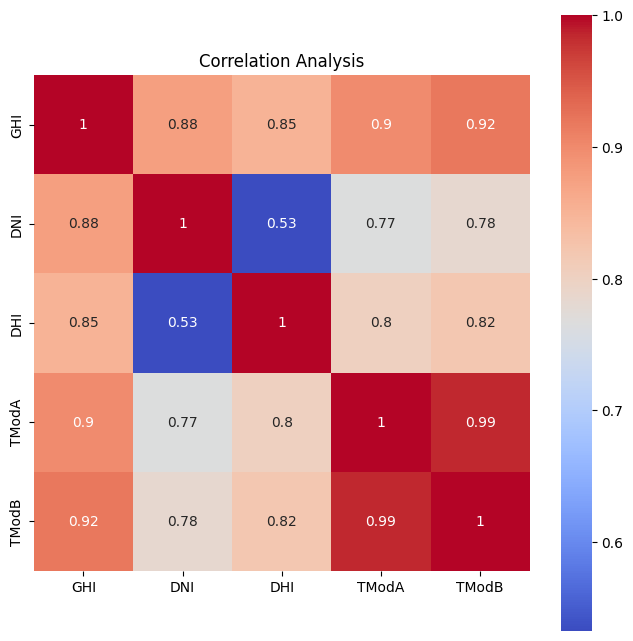

In [22]:
corr_matrix = calculate_correlation_matrix(togo_df)
create_correlation_heatmap(corr_matrix)

<Figure size 1000x800 with 0 Axes>

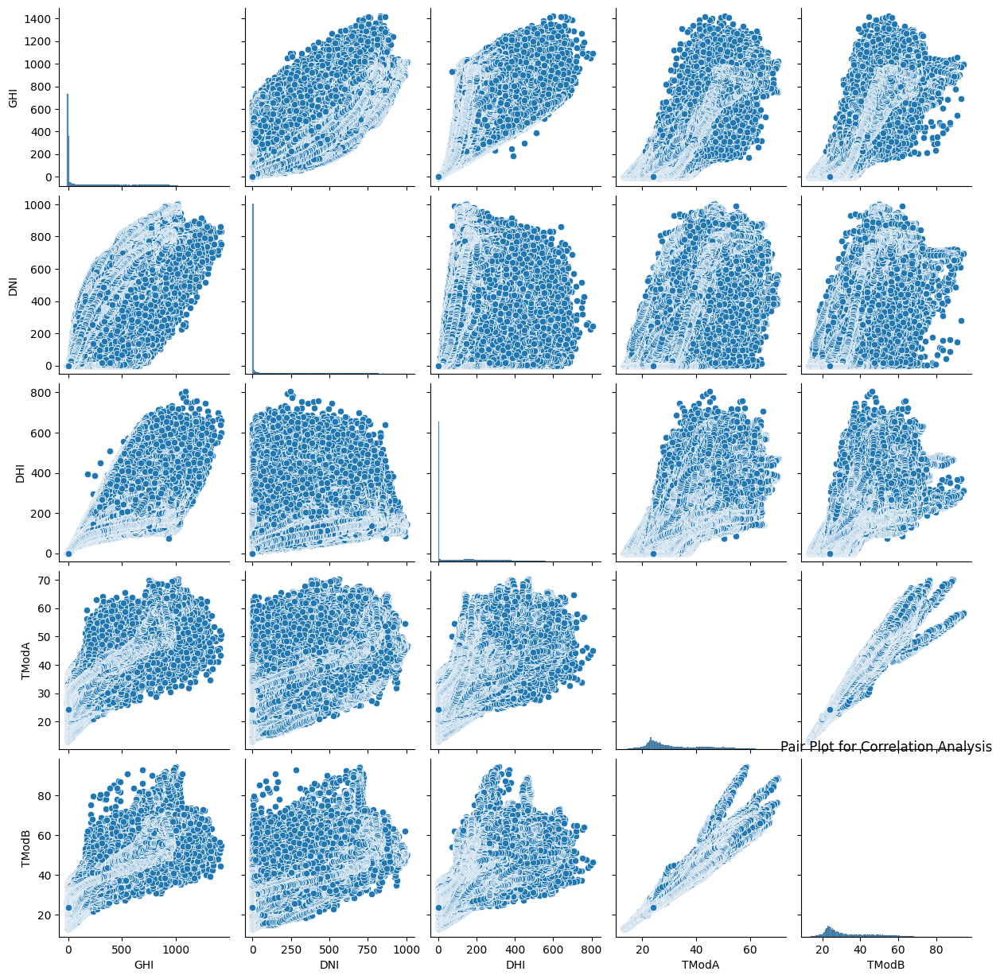

In [26]:
create_pair_plot(togo_df)

<Figure size 1000x800 with 0 Axes>

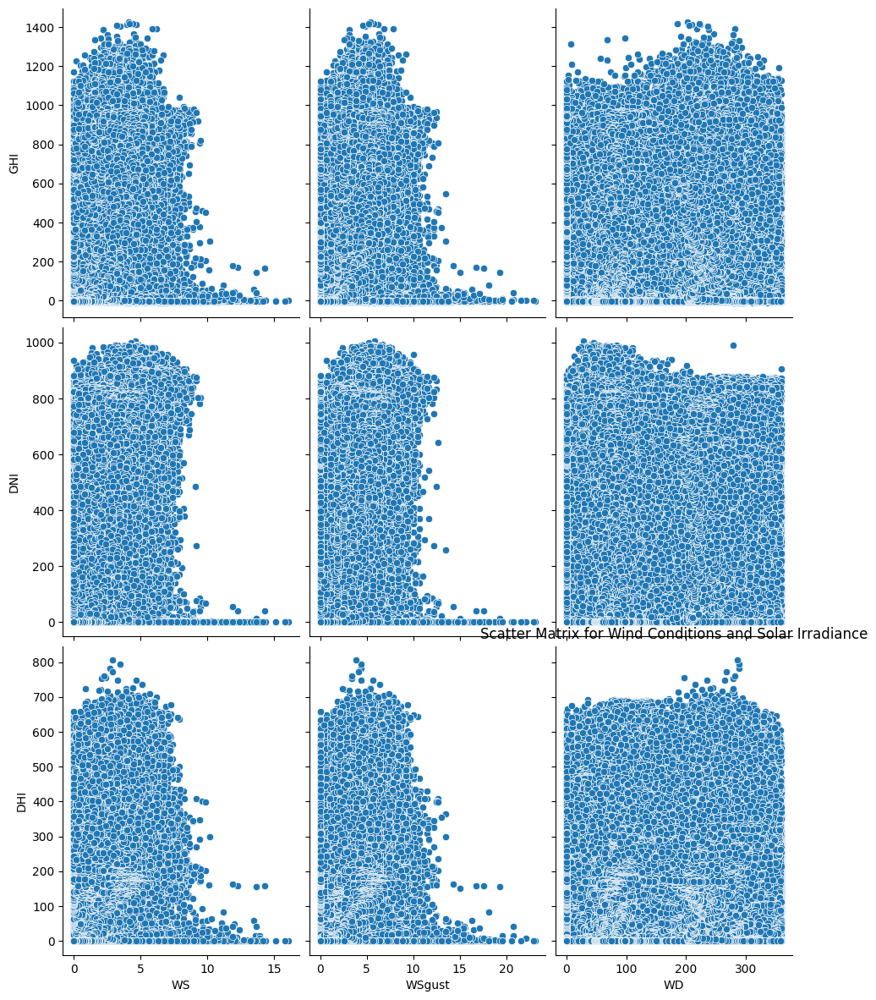

In [27]:
create_scatter_matrix(togo_df)

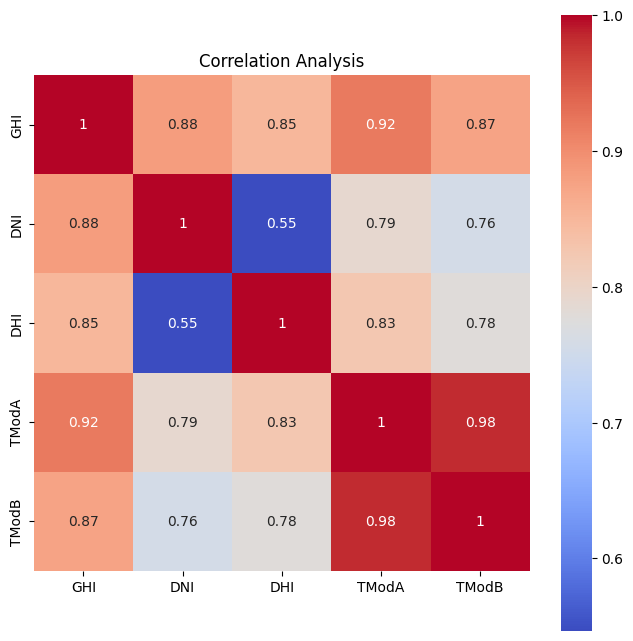

<Figure size 1000x800 with 0 Axes>

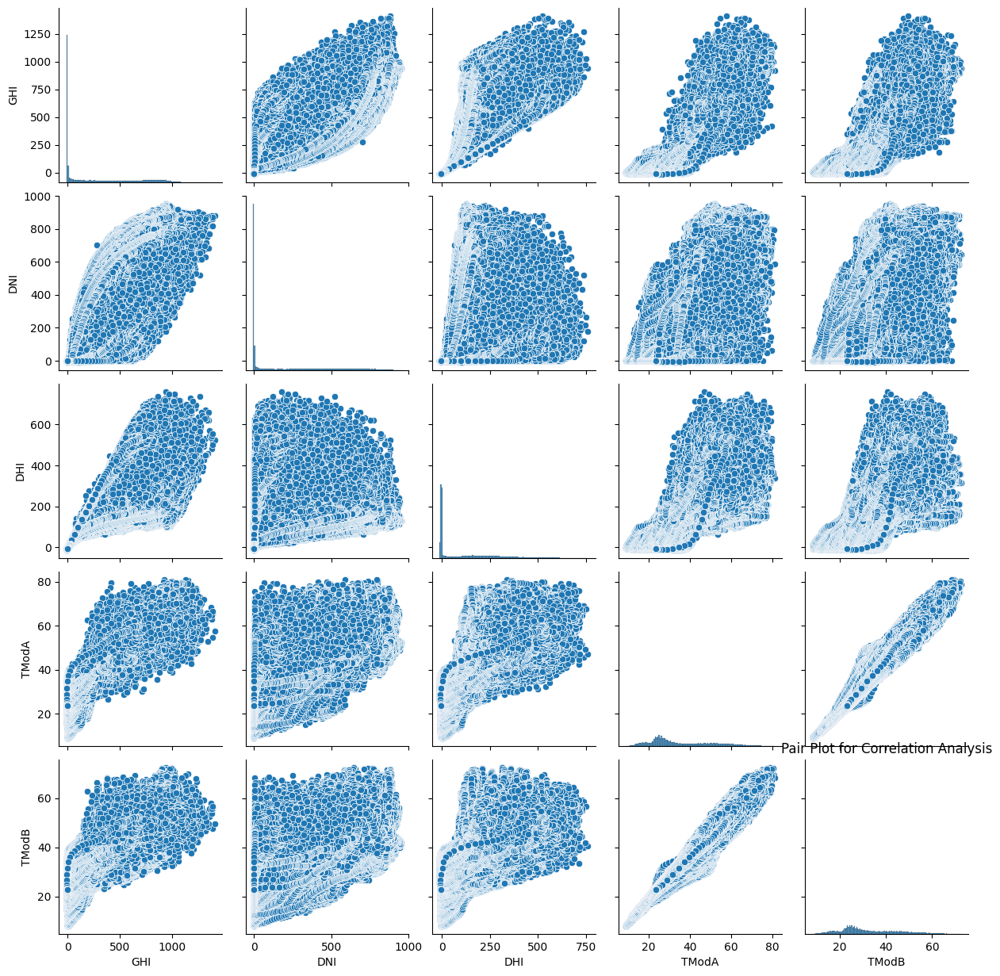

<Figure size 1000x800 with 0 Axes>

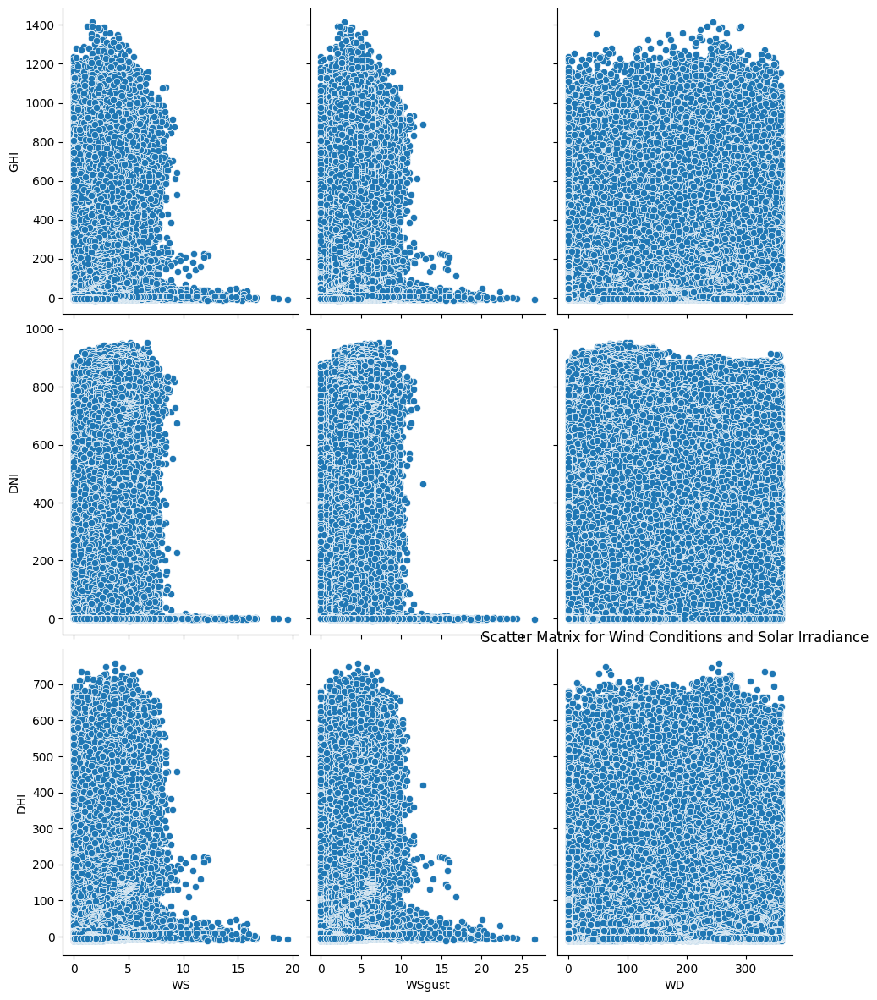

In [28]:
corr_matrix = calculate_correlation_matrix(benin_df)
create_correlation_heatmap(corr_matrix)
create_pair_plot(benin_df)
create_scatter_matrix(benin_df)

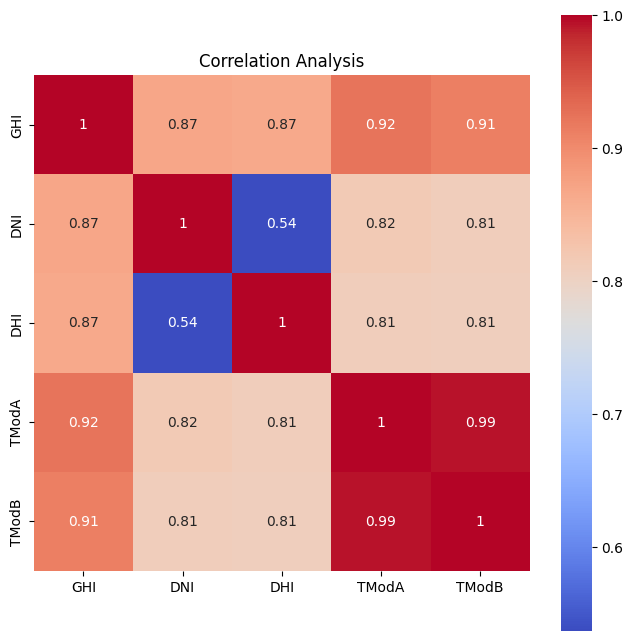

<Figure size 1000x800 with 0 Axes>

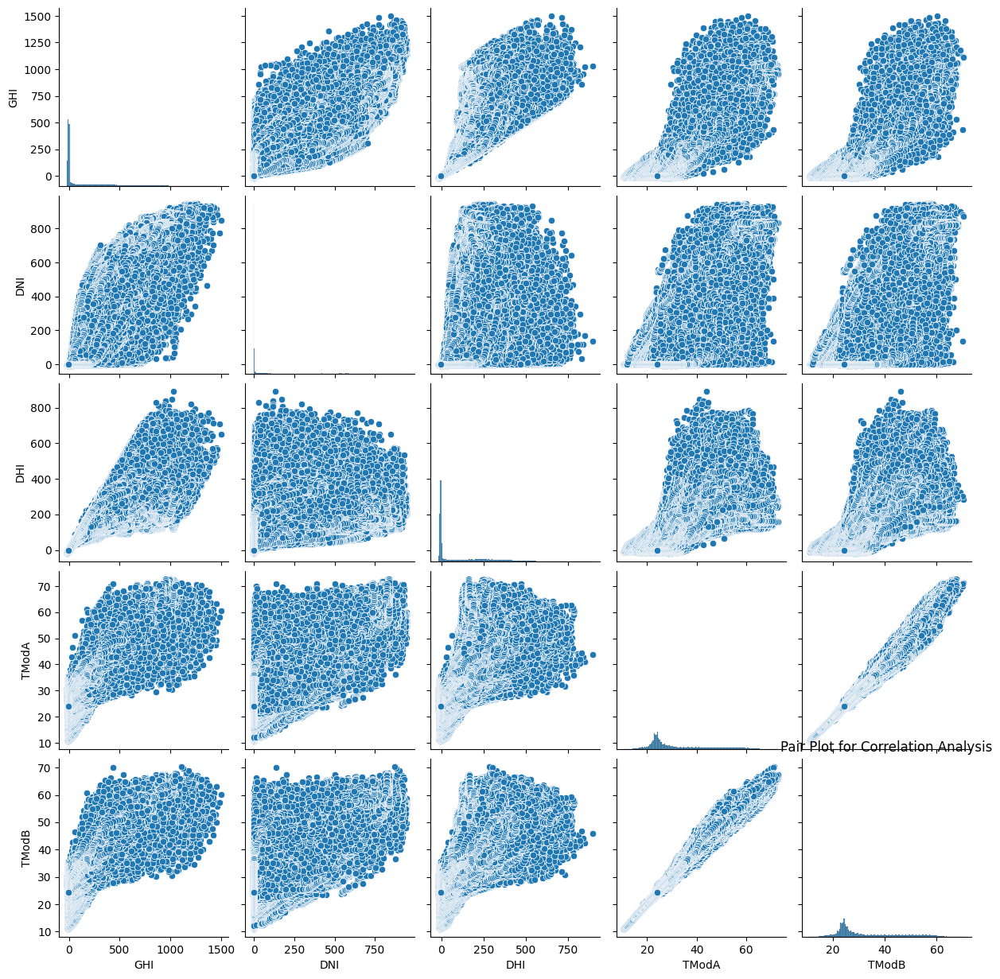

<Figure size 1000x800 with 0 Axes>

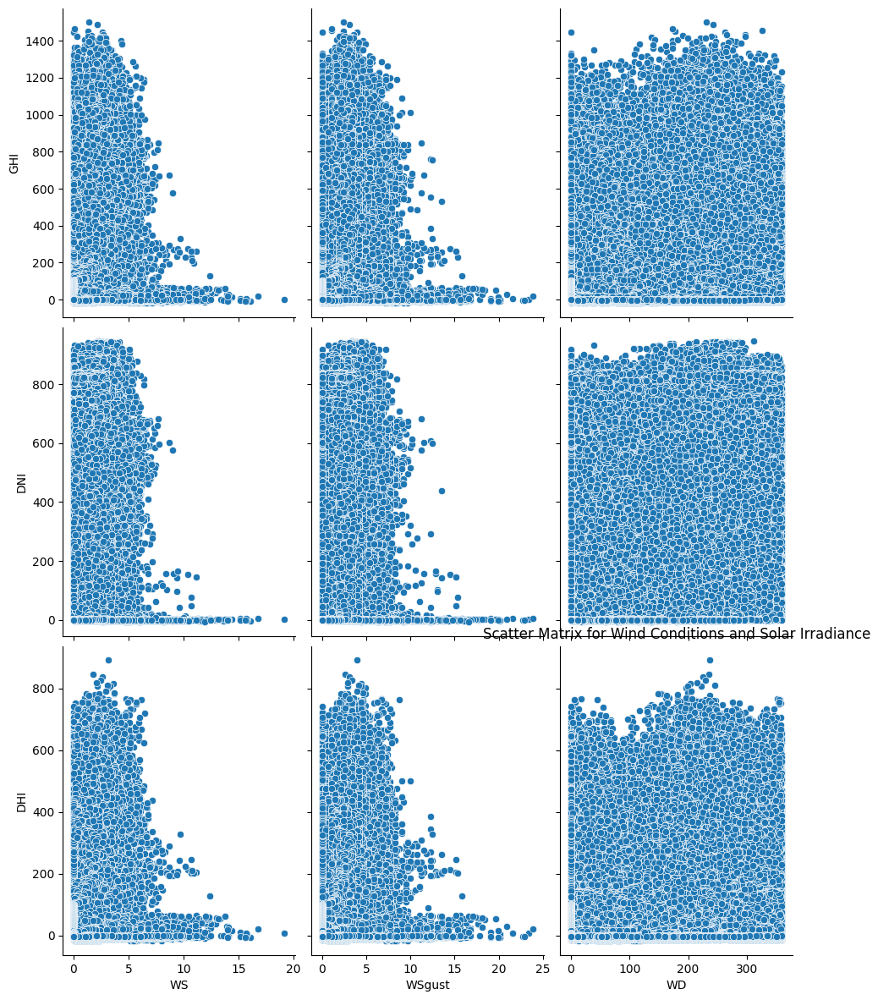

In [29]:
corr_matrix = calculate_correlation_matrix(sierraleone_df)
create_correlation_heatmap(corr_matrix)
create_pair_plot(sierraleone_df)
create_scatter_matrix(sierraleone_df)

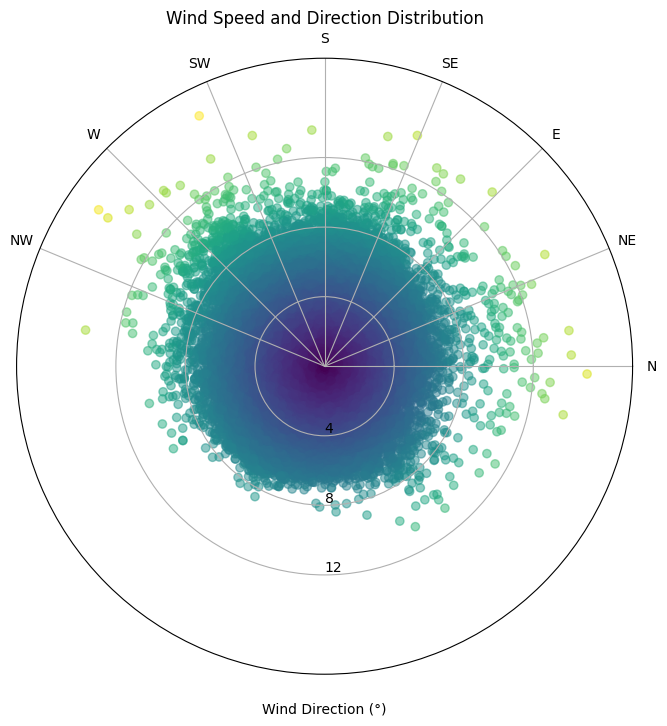

In [4]:
create_polar_plot(togo_df, ws_col='WS', wd_col='WD')

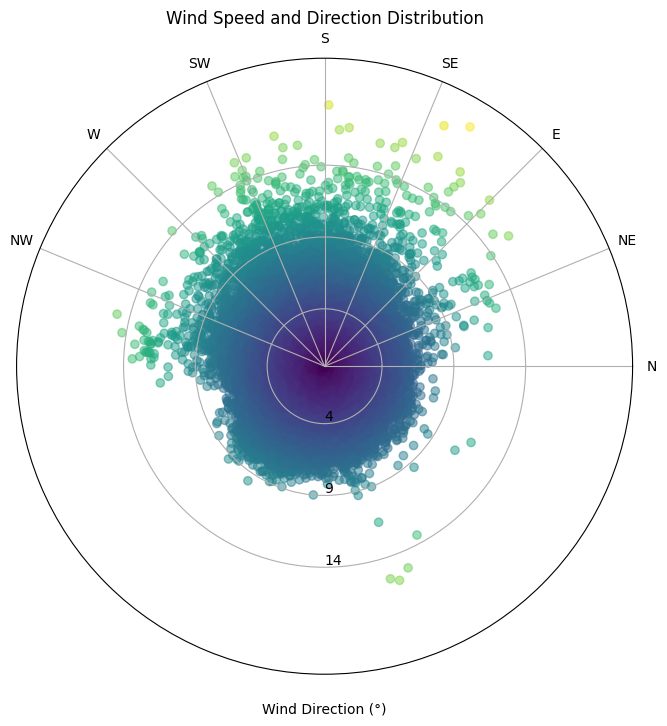

In [5]:
create_polar_plot(benin_df, ws_col='WS', wd_col='WD')

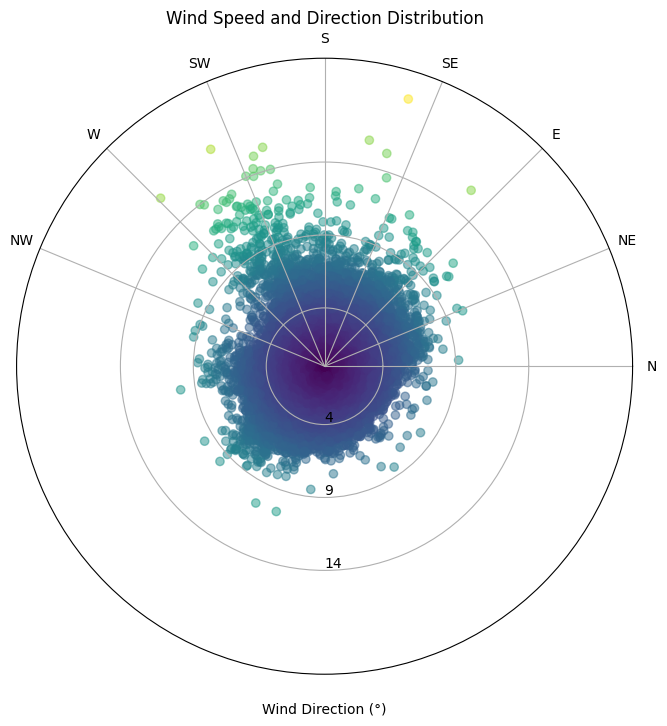

In [6]:
create_polar_plot(sierraleone_df, ws_col='WS', wd_col='WD')

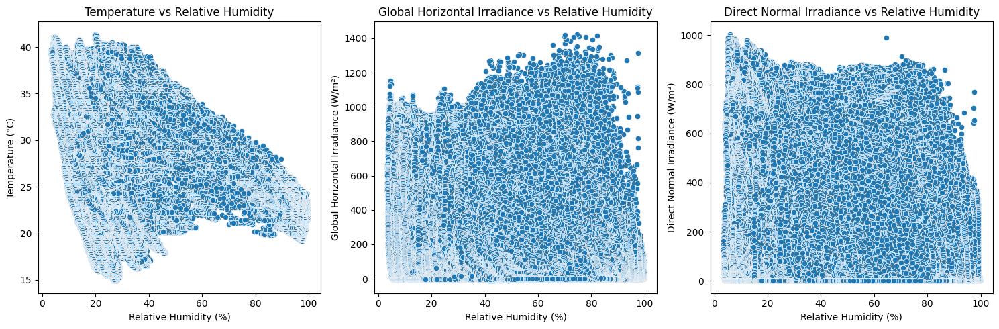

          Tamb        RH       GHI       DNI
Tamb  1.000000 -0.400410  0.562533  0.504499
RH   -0.400410  1.000000 -0.258077 -0.327887
GHI   0.562533 -0.258077  1.000000  0.877293
DNI   0.504499 -0.327887  0.877293  1.000000


In [4]:
analyze_temperature_data(togo_df)

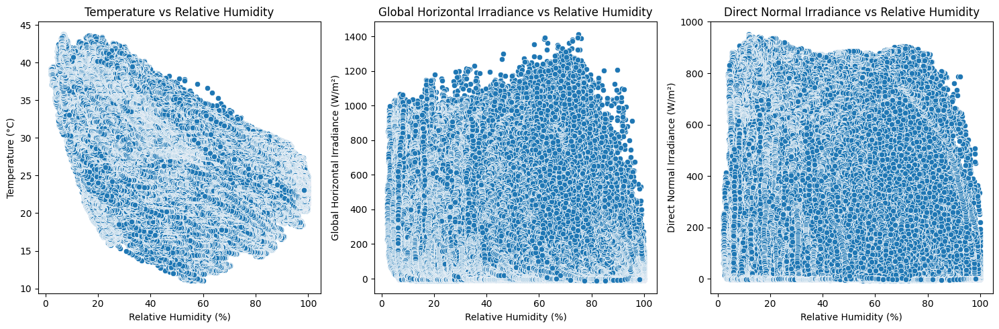

          Tamb        RH       GHI       DNI
Tamb  1.000000 -0.414842  0.547513  0.467584
RH   -0.414842  1.000000 -0.360029 -0.373475
GHI   0.547513 -0.360029  1.000000  0.882376
DNI   0.467584 -0.373475  0.882376  1.000000


In [5]:
analyze_temperature_data(benin_df)

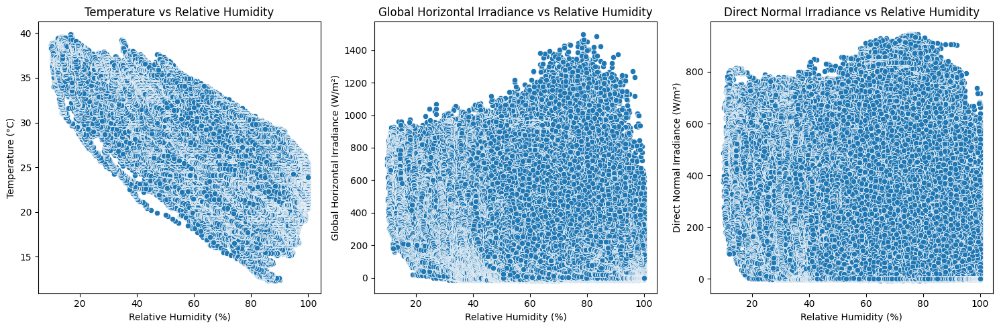

          Tamb        RH       GHI       DNI
Tamb  1.000000 -0.791937  0.641261  0.578346
RH   -0.791937  1.000000 -0.546677 -0.548800
GHI   0.641261 -0.546677  1.000000  0.869108
DNI   0.578346 -0.548800  0.869108  1.000000


In [6]:
analyze_temperature_data(sierraleone_df)

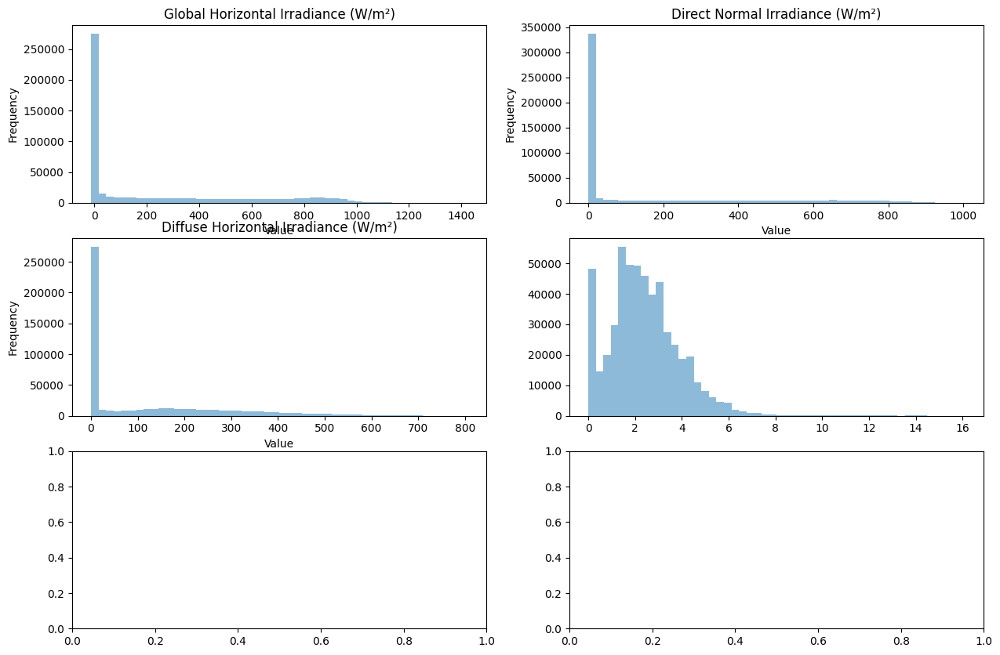

In [4]:
create_histograms(togo_df)

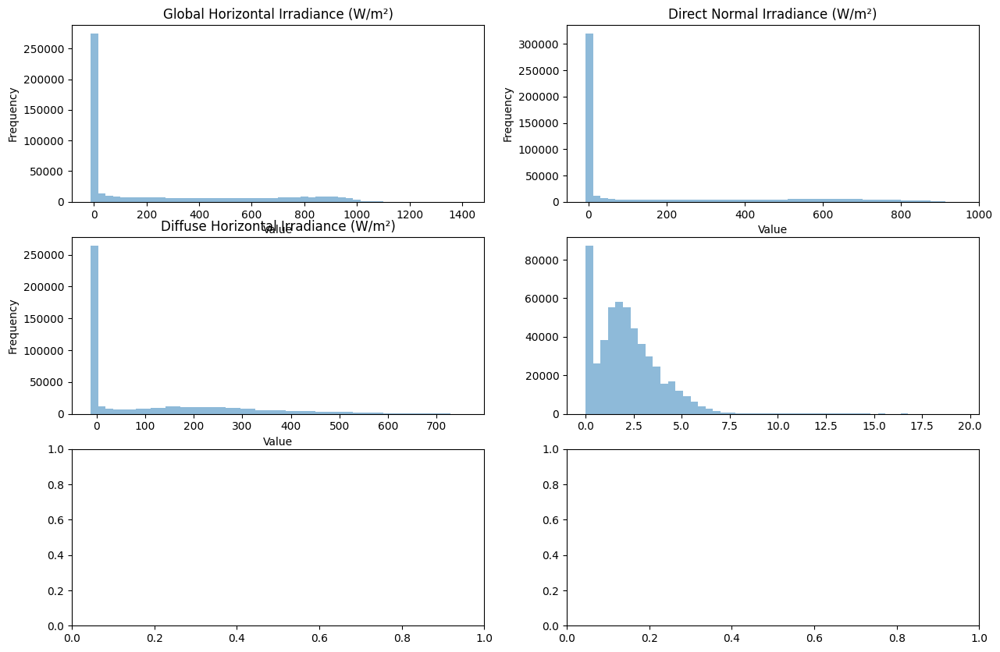

In [5]:
create_histograms(benin_df)

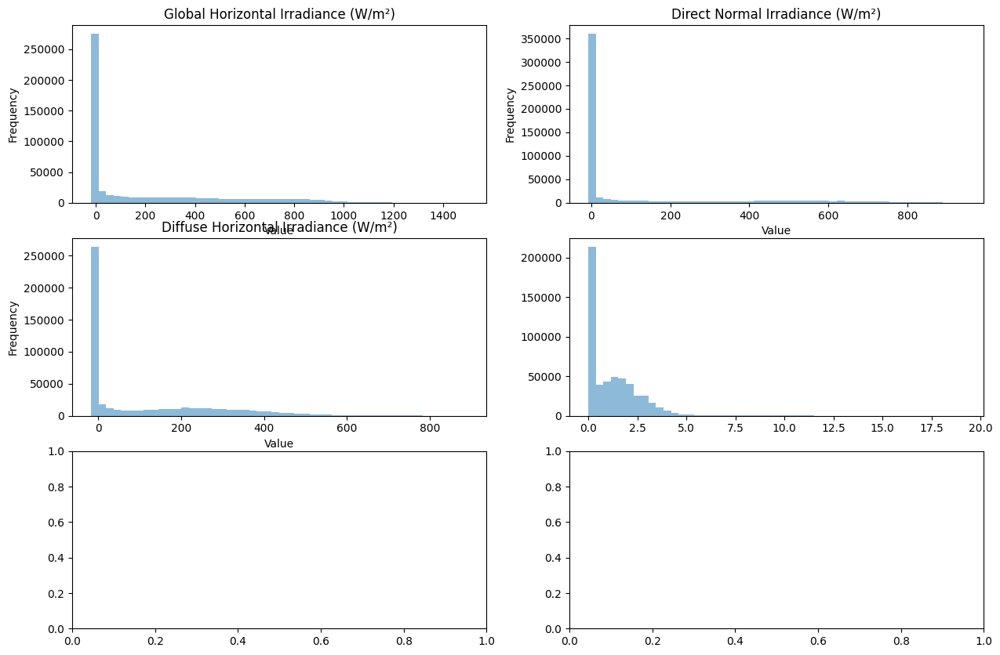

In [6]:
create_histograms(sierraleone_df)

In [5]:
cols = ['GHI', 'DNI', 'DHI', 'WS', 'Tamb', 'TModA']
togo_zdf = calculate_zscores(togo_df, cols)
togo_zdf

,Timestamp,GHI,DNI,DHI,ModA,ModB,Tamb,RH,WS,WSgust,...,TModA,TModB,Comments,GHI_zscore,DNI_zscore,DHI_zscore,WS_zscore,Tamb_zscore,TModA_zscore,outlier
0,2021-10-25 00:01,-1.3,0.0,0.0,0.0,0.0,24.8,94.5,0.9,1.1,...,24.7,24.4,NaN,0.718858,0.602727,0.743955,1.003709,0.620381,0.704143,0
1,2021-10-25 00:02,-1.3,0.0,0.0,0.0,0.0,24.8,94.4,1.1,1.6,...,24.7,24.4,NaN,0.718858,0.602727,0.743955,0.866973,0.620381,0.704143,0
2,2021-10-25 00:03,-1.3,0.0,0.0,0.0,0.0,24.8,94.4,1.2,1.4,...,24.7,24.4,NaN,0.718858,0.602727,0.743955,0.798605,0.620381,0.704143,0
3,2021-10-25 00:04,-1.2,0.0,0.0,0.0,0.0,24.8,94.3,1.2,1.6,...,24.7,24.4,NaN,0.718548,0.602727,0.743955,0.798605,0.620381,0.704143,0
4,2021-10-25 00:05,-1.2,0.0,0.0,0.0,0.0,24.8,94.0,1.3,1.6,...,24.7,24.4,NaN,0.718548,0.602727,0.743955,0.730237,0.620381,0.704143,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
525595,2022-10-24 23:56,-0.8,0.0,0.0,0.0,0.0,25.2,53.8,0.0,0.0,...,24.3,24.0,NaN,0.717308,0.602727,0.743955,1.619024,0.536313,0.740512,0
525596,2022-10-24 23:57,-0.9,0.0,0.0,0.0,0.0,25.3,53.5,0.0,0.0,...,24.3,24.0,NaN,0.717618,0.602727,0.743955,1.619024,0.515296,0.740512,0
525597,2022-10-24 23:58,-1.0,0.0,0.0,0.0,0.0,25.3,53.4,0.0,0.0,...,24.2,23.9,NaN,0.717928,0.602727,0.743955,1.619024,0.515296,0.749605,0
525598,2022-10-24 23:59,-1.1,0.0,0.0,0.0,0.0,25.4,53.5,0.0,0.0,...,24.1,23.8,NaN,0.718238,0.602727,0.743955,1.619024,0.494278,0.758697,0


In [6]:
cols = ['GHI', 'DNI', 'DHI', 'WS', 'Tamb', 'TModA']
benin_zdf = calculate_zscores(benin_df, cols)
benin_zdf

,Timestamp,GHI,DNI,DHI,ModA,ModB,Tamb,RH,WS,WSgust,...,TModA,TModB,Comments,GHI_zscore,DNI_zscore,DHI_zscore,WS_zscore,Tamb_zscore,TModA_zscore,outlier
0,2021-08-09 00:01,-1.2,-0.2,-1.1,0.0,0.0,26.2,93.4,0.0,0.4,...,26.3,26.2,NaN,0.730101,0.639590,0.733872,1.322830,0.334163,0.604165,0
1,2021-08-09 00:02,-1.1,-0.2,-1.1,0.0,0.0,26.2,93.6,0.0,0.0,...,26.3,26.2,NaN,0.729799,0.639590,0.733872,1.322830,0.334163,0.604165,0
2,2021-08-09 00:03,-1.1,-0.2,-1.1,0.0,0.0,26.2,93.7,0.3,1.1,...,26.4,26.2,NaN,0.729799,0.639590,0.733872,1.135735,0.334163,0.597411,0
3,2021-08-09 00:04,-1.1,-0.1,-1.0,0.0,0.0,26.2,93.3,0.2,0.7,...,26.4,26.3,NaN,0.729799,0.639208,0.733242,1.198100,0.334163,0.597411,0
4,2021-08-09 00:05,-1.0,-0.1,-1.0,0.0,0.0,26.2,93.3,0.1,0.7,...,26.4,26.3,NaN,0.729497,0.639208,0.733242,1.260465,0.334163,0.597411,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
525595,2022-08-08 23:56,-5.5,-0.1,-5.9,0.0,0.0,23.1,98.3,0.3,1.1,...,23.5,22.9,NaN,0.743087,0.639208,0.764120,1.135735,0.857432,0.793261,0
525596,2022-08-08 23:57,-5.5,-0.1,-5.8,0.0,0.0,23.1,98.3,0.2,0.7,...,23.5,22.9,NaN,0.743087,0.639208,0.763489,1.198100,0.857432,0.793261,0
525597,2022-08-08 23:58,-5.5,-0.1,-5.8,0.0,0.0,23.1,98.4,0.6,1.1,...,23.5,22.9,NaN,0.743087,0.639208,0.763489,0.948641,0.857432,0.793261,0
525598,2022-08-08 23:59,-5.5,-0.1,-5.8,0.0,0.0,23.1,98.3,0.9,1.3,...,23.5,22.9,NaN,0.743087,0.639208,0.763489,0.761546,0.857432,0.793261,0


In [7]:
cols = ['GHI', 'DNI', 'DHI', 'WS', 'Tamb', 'TModA']
sierraleone_zdf = calculate_zscores(sierraleone_df, cols)
sierraleone_zdf

,Timestamp,GHI,DNI,DHI,ModA,ModB,Tamb,RH,WS,WSgust,...,TModA,TModB,Comments,GHI_zscore,DNI_zscore,DHI_zscore,WS_zscore,Tamb_zscore,TModA_zscore,outlier
0,2021-10-30 00:01,-0.7,-0.1,-0.8,0.0,0.0,21.9,99.1,0.0,0.0,...,22.3,22.6,NaN,0.678931,0.532700,0.720500,0.924845,1.004726,0.820615,0
1,2021-10-30 00:02,-0.7,-0.1,-0.8,0.0,0.0,21.9,99.2,0.0,0.0,...,22.3,22.6,NaN,0.678931,0.532700,0.720500,0.924845,1.004726,0.820615,0
2,2021-10-30 00:03,-0.7,-0.1,-0.8,0.0,0.0,21.9,99.2,0.0,0.0,...,22.3,22.6,NaN,0.678931,0.532700,0.720500,0.924845,1.004726,0.820615,0
3,2021-10-30 00:04,-0.7,0.0,-0.8,0.0,0.0,21.9,99.3,0.0,0.0,...,22.3,22.6,NaN,0.678931,0.532243,0.720500,0.924845,1.004726,0.820615,0
4,2021-10-30 00:05,-0.7,-0.1,-0.8,0.0,0.0,21.9,99.3,0.0,0.0,...,22.3,22.6,NaN,0.678931,0.532700,0.720500,0.924845,1.004726,0.820615,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
525595,2022-10-29 23:56,-1.6,-0.1,-2.9,0.0,0.0,24.0,100.0,0.0,0.0,...,24.2,24.5,NaN,0.681946,0.532700,0.733712,0.924845,0.527302,0.667819,0
525596,2022-10-29 23:57,-1.7,-0.1,-3.0,0.0,0.0,24.0,100.0,0.0,0.0,...,24.2,24.5,NaN,0.682281,0.532700,0.734341,0.924845,0.527302,0.667819,0
525597,2022-10-29 23:58,-1.7,-0.1,-3.1,0.0,0.0,24.0,100.0,0.0,0.0,...,24.1,24.4,NaN,0.682281,0.532700,0.734970,0.924845,0.527302,0.675861,0
525598,2022-10-29 23:59,-1.7,-0.2,-3.3,0.0,0.0,23.9,100.0,0.0,0.0,...,24.1,24.4,NaN,0.682281,0.533158,0.736228,0.924845,0.550037,0.675861,0


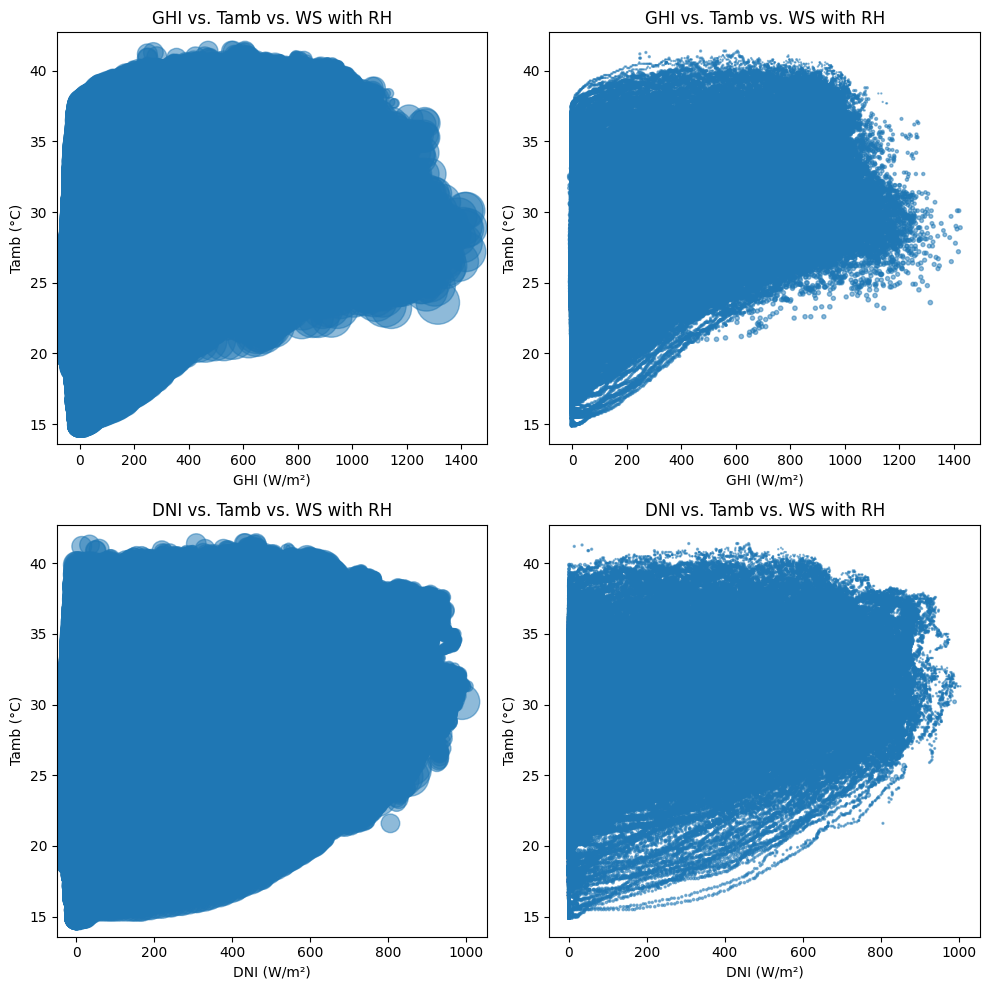

In [4]:
cols = ['GHI', 'DNI', 'Tamb', 'WS']
bubble_col = 'RH'
create_bubble_charts(togo_df, cols, bubble_col)

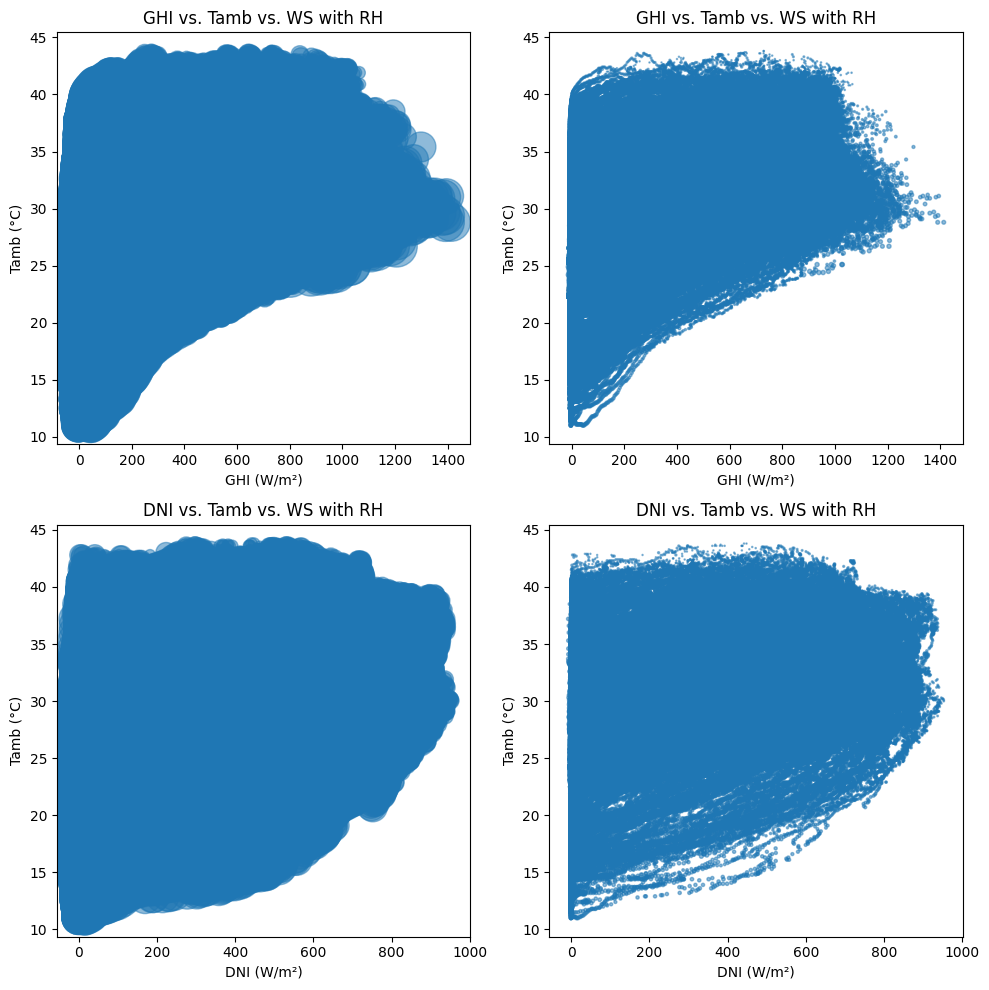

In [5]:
cols = ['GHI', 'DNI', 'Tamb', 'WS']
bubble_col = 'RH'
create_bubble_charts(benin_df, cols, bubble_col)

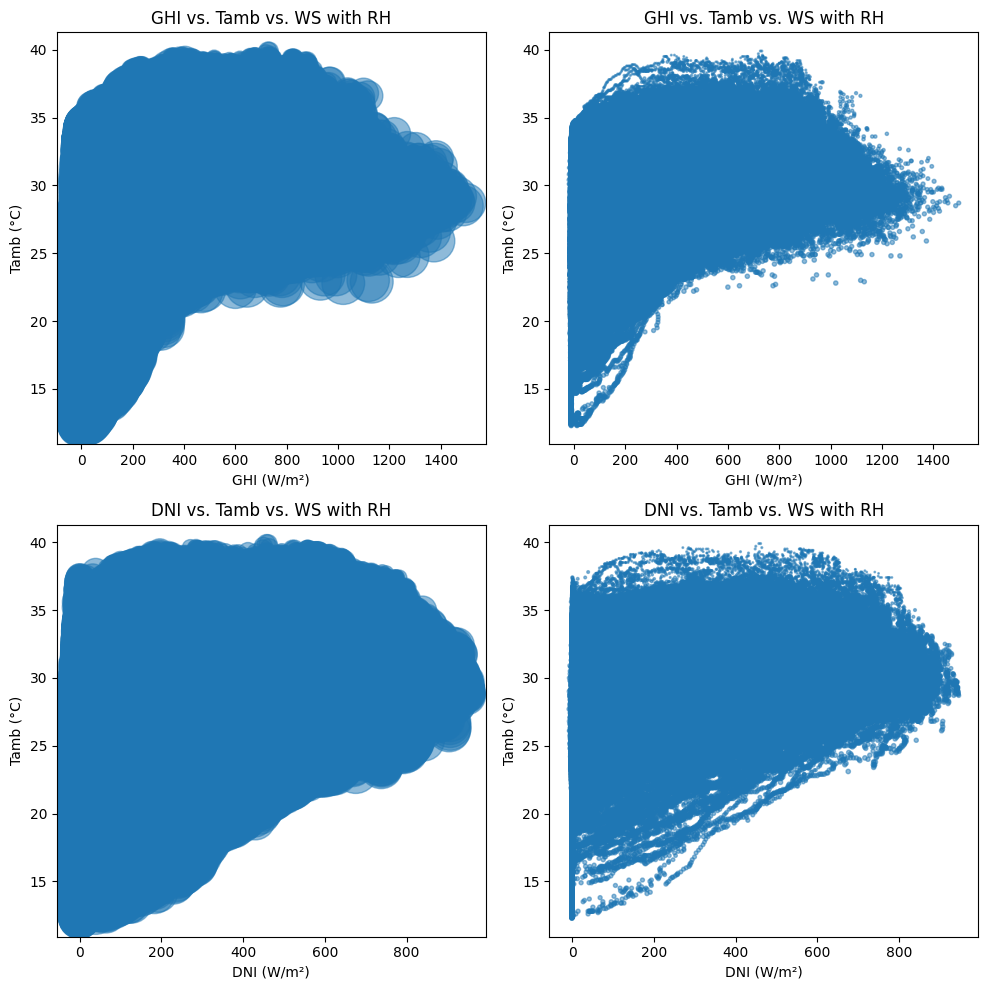

In [6]:
cols = ['GHI', 'DNI', 'Tamb', 'WS']
bubble_col = 'RH'
create_bubble_charts(sierraleone_df, cols, bubble_col)